In [1]:
from utils import file
import matplotlib.pyplot as plt 
import segmentation_models as sm

Segmentation Models: using `keras` framework.


In [2]:
TRAINING_IMAGE_PATH = 'training/images'
TRAINING_MASK_PATH = 'training/masks'

In [3]:
trainingImagePaths = file.getSortedFilePaths(TRAINING_IMAGE_PATH)
trainingMaskPaths = file.getSortedFilePaths(TRAINING_MASK_PATH)

In [4]:
print("Number of samples:", len(trainingImagePaths), len(trainingMaskPaths))
for input_path, target_path in zip(trainingImagePaths[:10], trainingMaskPaths[:10]):
    print(input_path[-31:], "|", target_path[-34:])

Number of samples: 53 53
ta\training/images\IDRiD_01.jpg | ata\training/masks\IDRiD_01_HE.tif
ta\training/images\IDRiD_02.jpg | ata\training/masks\IDRiD_02_HE.tif
ta\training/images\IDRiD_03.jpg | ata\training/masks\IDRiD_03_HE.tif
ta\training/images\IDRiD_04.jpg | ata\training/masks\IDRiD_04_HE.tif
ta\training/images\IDRiD_05.jpg | ata\training/masks\IDRiD_05_HE.tif
ta\training/images\IDRiD_06.jpg | ata\training/masks\IDRiD_06_HE.tif
ta\training/images\IDRiD_07.jpg | ata\training/masks\IDRiD_07_HE.tif
ta\training/images\IDRiD_08.jpg | ata\training/masks\IDRiD_08_HE.tif
ta\training/images\IDRiD_09.jpg | ata\training/masks\IDRiD_09_HE.tif
ta\training/images\IDRiD_10.jpg | ata\training/masks\IDRiD_10_HE.tif


In [ ]:
# Testing image data set generation
import tensorflow as tf
image = tf.io.read_file(trainingImagePaths[0])
image = tf.io.decode_jpeg(image)
image = tf.squeeze(image)
image.set_shape([None, None, 3])
image = tf.image.adjust_contrast(image, 2.5)
image = tf.image.crop_to_bounding_box(image, 292, 472, 512, 512)
image = tf.cast(image, tf.int32)
print(image.numpy().min())
plt.figure(figsize=(20, 20))
plt.imshow(image)
plt.show()

In [5]:
trainDataset = file.datasetGenerator(trainingImagePaths, trainingMaskPaths)
trainDataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.int32, name=None), TensorSpec(shape=(None, 512, 512, 1), dtype=tf.int32, name=None))>

(2, 512, 512, 3) (2, 512, 512, 1)
0 0
[0]


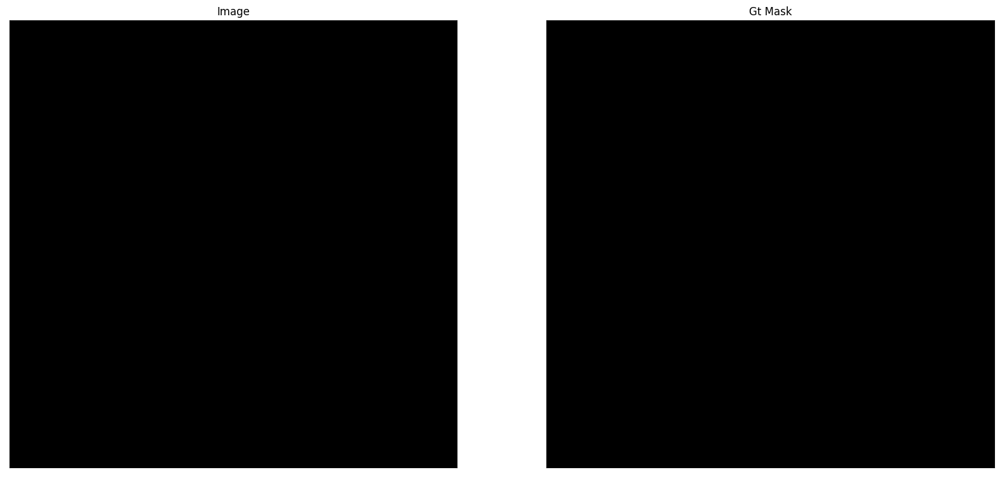

0 0
[0]


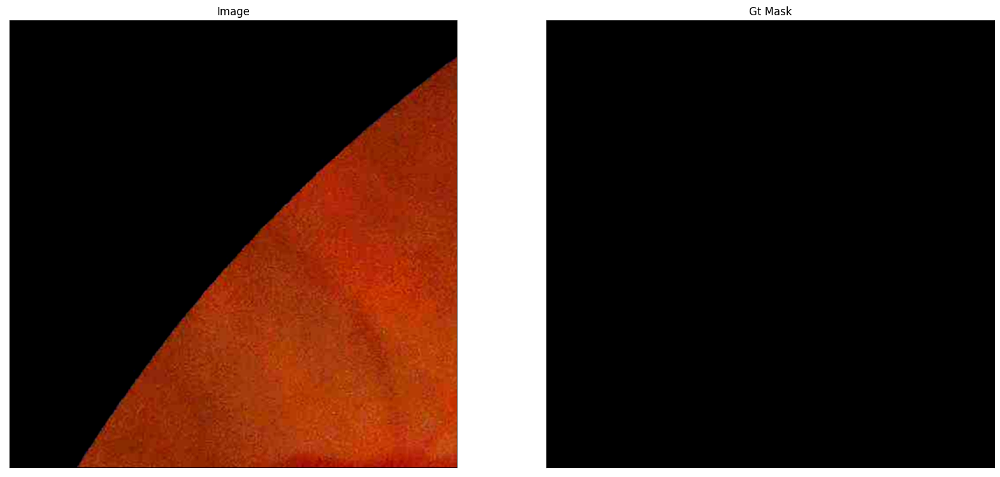

In [6]:
file.testDataset(trainDataset)

In [7]:
# Model
from tensorflow import keras 

# Free up RAM in case the model definition cells were run multiple times
keras.backend.clear_session()
BACKBONE   = 'efficientnetb0'
n_classes  = 1 
activation = 'sigmoid' 
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation)
linknet_model =  sm.Linknet(BACKBONE, classes=n_classes, activation=activation)

In [8]:
class DisplayCallback(keras.callbacks.Callback):
    def __init__(self, dataset, epoch_interval=5):
        self.dataset = dataset
        self.epoch_interval = epoch_interval
    
    def display(self, display_list, extra_title=''):
        plt.figure(figsize=(15, 15))
        title = ['Input Image', 'True Mask', 'Predicted Mask']

        if len(display_list) > len(title):
            title.append(extra_title)

        for i in range(len(display_list)):
            plt.subplot(1, len(display_list), i+1)
            plt.title(title[i])
            plt.imshow(display_list[i], cmap='gray')
            plt.axis('off')
        plt.show()
        
    def create_mask(self, pred_mask):
        pred_mask = (pred_mask > 0.5).astype("int32")
        return pred_mask[0]
    
    def show_predictions(self, dataset, num=4):
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)
            self.display([image[0], mask[0], self.create_mask(pred_mask)])
        
    def on_epoch_end(self, epoch, logs=None):
        if epoch and epoch % self.epoch_interval == 0:
            self.show_predictions(self.dataset)
            print ('\nSample Prediction after epoch {}\n'.format(epoch+1))

In [9]:
# define optimizer
optimizer = keras.optimizers.Adam(0.0001)
bce   = keras.losses.BinaryCrossentropy()
metrics = ["accuracy"]

# compile keras model with defined optimizer, loss and metrics
model.compile(optimizer, bce, metrics)
linknet_model.compile(optimizer, bce, metrics)

In [10]:
linknet_epochs = "50"
unet_epochs = "70"
unet_checkpoint_path = "./unet-checkpoints/"+ unet_epochs + "-epochs/checkpoint"
linknet_checkpoint_path = "./linknet-checkpoints/" + linknet_epochs + "-epochs/heamorrahage-checkpoint"

In [11]:
model.load_weights(unet_checkpoint_path)
linknet_model.load_weights(linknet_checkpoint_path)

Epoch 1/10
2147/2147 [==============================] - 508s 234ms/step - loss: 0.0044 - accuracy: 0.9982
Epoch 2/10
2147/2147 [==============================] - 506s 233ms/step - loss: 0.0049 - accuracy: 0.9980
Epoch 3/10
2147/2147 [==============================] - 484s 222ms/step - loss: 0.0041 - accuracy: 0.9984
Epoch 4/10
2147/2147 [==============================] - 487s 224ms/step - loss: 0.0038 - accuracy: 0.9985
Epoch 5/10
2147/2147 [==============================] - 496s 228ms/step - loss: 0.0038 - accuracy: 0.9985
Epoch 6/10
1/1 [==============================] - 0s 152ms/step - loss: 0.0040 - accuracy: 0.99


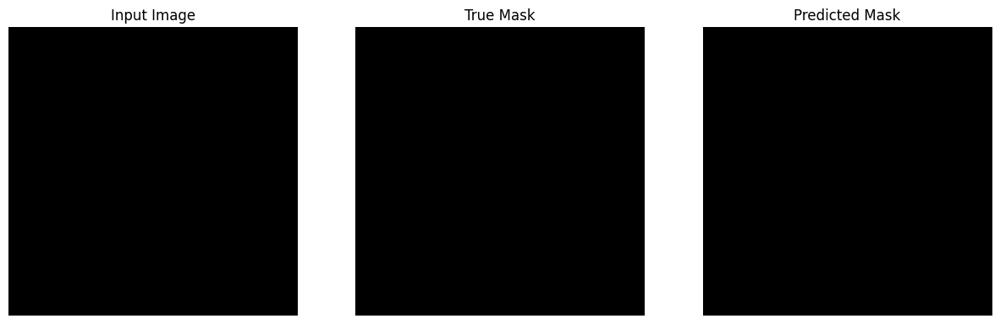

1/1 [==============================] - 0s 28ms/step


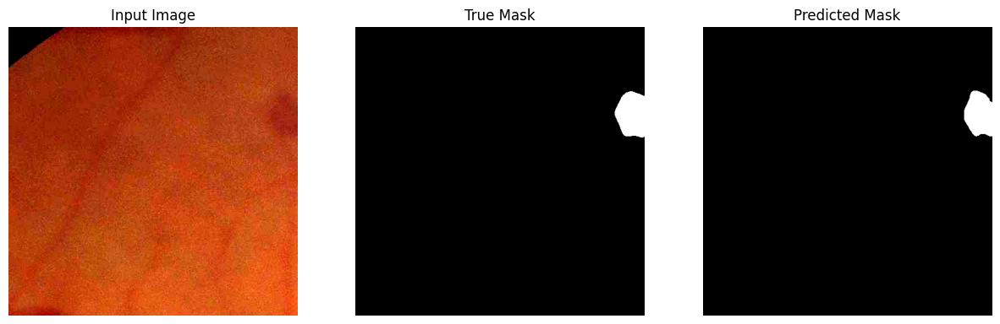

1/1 [==============================] - 0s 29ms/step


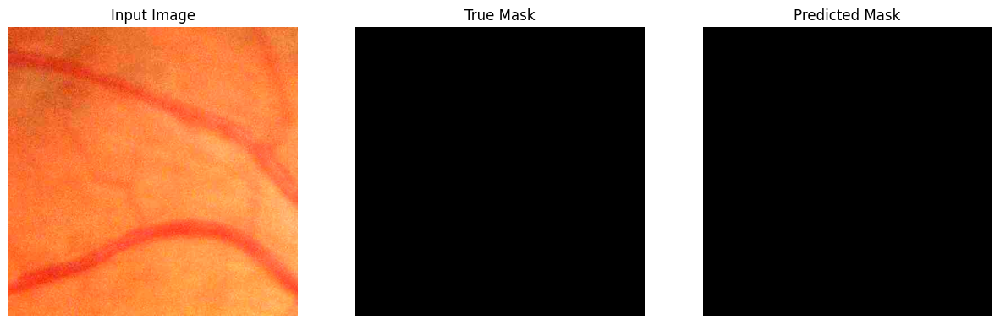

1/1 [==============================] - 0s 29ms/step


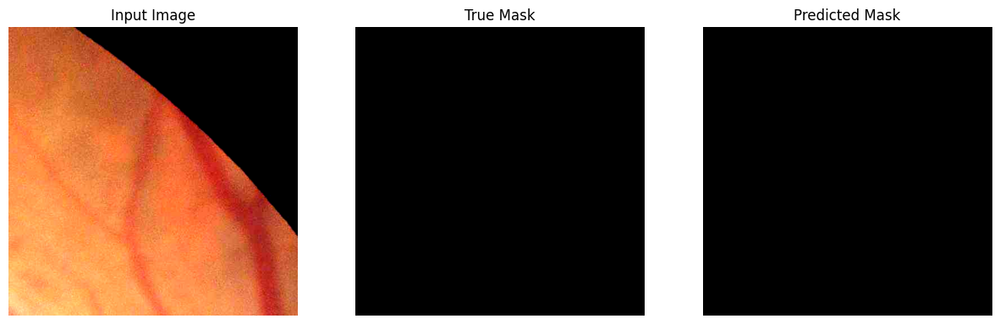


Sample Prediction after epoch 6

2147/2147 [==============================] - 468s 215ms/step - loss: 0.0040 - accuracy: 0.9984
Epoch 7/10
2147/2147 [==============================] - 458s 211ms/step - loss: 0.0040 - accuracy: 0.9984
Epoch 8/10
2147/2147 [==============================] - 457s 210ms/step - loss: 0.0037 - accuracy: 0.9985
Epoch 9/10
2147/2147 [==============================] - 481s 221ms/step - loss: 0.0045 - accuracy: 0.9984
Epoch 10/10
2147/2147 [==============================] - 487s 224ms/step - loss: 0.0036 - accuracy: 0.9986


In [29]:
linknet_model.fit(
    trainDataset, 
    callbacks=[DisplayCallback(trainDataset)],
    epochs=10
)

In [30]:
linknet_model.save_weights(linknet_checkpoint_path)

Epoch 1/10
      6/Unknown - 17s 244ms/step - loss: 6.5325e-04 - accuracy: 0.9997WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.1037s vs `on_train_batch_end` time: 0.1283s). Check your callbacks.
2147/2147 [==============================] - 552s 250ms/step - loss: 0.0057 - accuracy: 0.9980
Epoch 2/10
2147/2147 [==============================] - 540s 249ms/step - loss: 0.0033 - accuracy: 0.9988
Epoch 3/10
2147/2147 [==============================] - 541s 249ms/step - loss: 0.0045 - accuracy: 0.9986
Epoch 4/10
2147/2147 [==============================] - 544s 250ms/step - loss: 0.0027 - accuracy: 0.9989
Epoch 5/10
2147/2147 [==============================] - 540s 249ms/step - loss: 0.0023 - accuracy: 0.9991
Epoch 6/10
1/1 [==============================] - 0s 68ms/steps - loss: 0.0024 - accuracy: 0.99


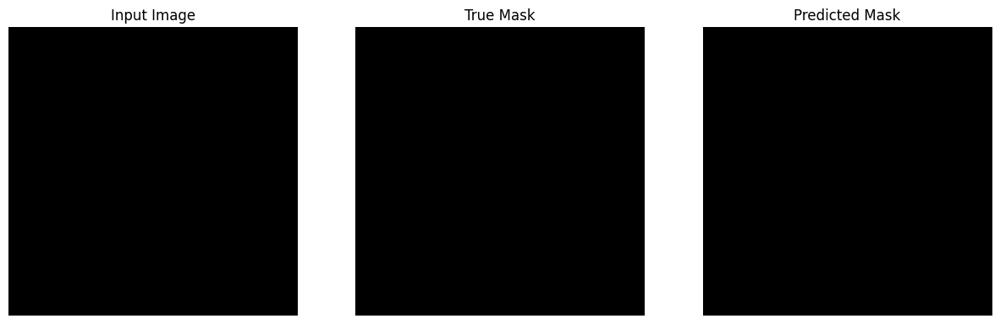

1/1 [==============================] - 0s 29ms/step


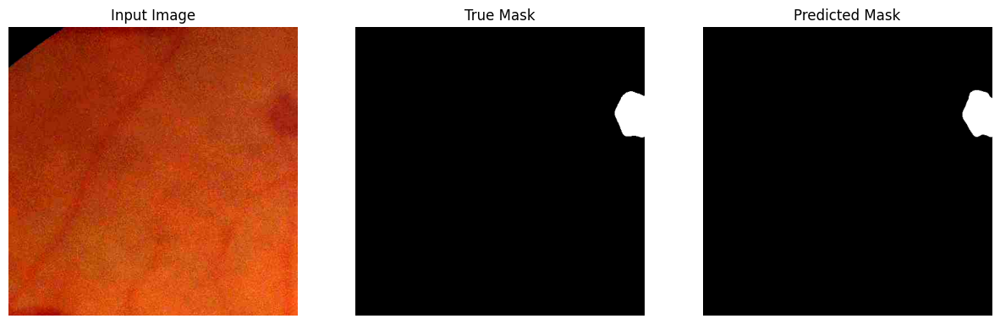

1/1 [==============================] - 0s 29ms/step


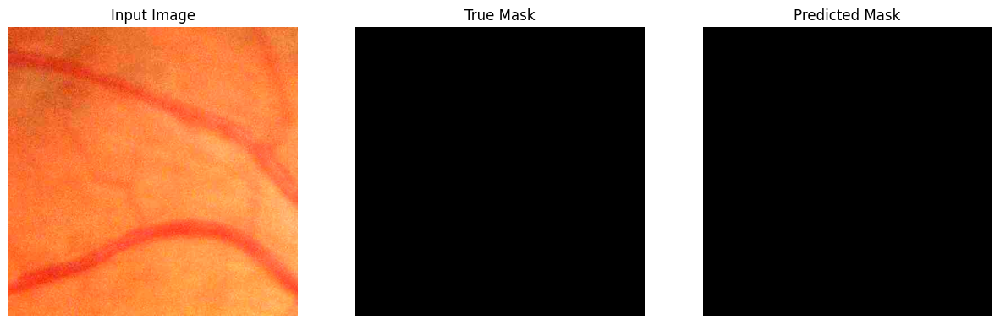

1/1 [==============================] - 0s 30ms/step


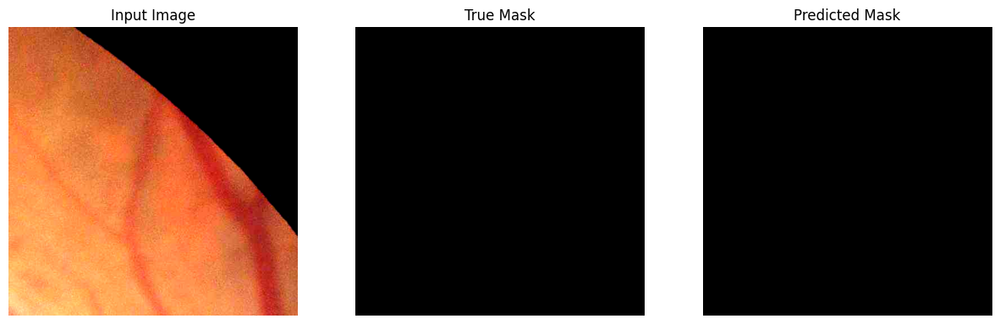


Sample Prediction after epoch 6

2147/2147 [==============================] - 554s 255ms/step - loss: 0.0024 - accuracy: 0.9990
Epoch 7/10
2147/2147 [==============================] - 542s 250ms/step - loss: 0.0025 - accuracy: 0.9990
Epoch 8/10
2147/2147 [==============================] - 540s 249ms/step - loss: 0.0026 - accuracy: 0.9990
Epoch 9/10
2147/2147 [==============================] - 539s 248ms/step - loss: 0.0023 - accuracy: 0.9991
Epoch 10/10
2147/2147 [==============================] - 537s 247ms/step - loss: 0.0023 - accuracy: 0.9991


In [25]:
model.fit(
    trainDataset, 
    callbacks=[DisplayCallback(trainDataset)],
    epochs=10
)

In [26]:
model.save_weights(unet_checkpoint_path)

In [21]:
TESTING_IMAGE_PATH = 'testing/images'
TESTING_MASK_PATH = 'testing/masks'

In [22]:
testingImagePaths = file.getSortedFilePaths(TESTING_IMAGE_PATH)
testingMaskPaths = file.getSortedFilePaths(TESTING_MASK_PATH)

In [ ]:
print("Number of samples:", len(testingImagePaths), len(testingMaskPaths))
for input_path, target_path in zip(testingImagePaths[:10], testingMaskPaths[:10]):
    print(input_path[-31:], "|", target_path[-34:])

In [23]:
testDataset = file.datasetGenerator(testingImagePaths, testingMaskPaths)
testDataset

<BatchDataset element_spec=(TensorSpec(shape=(None, 512, 512, 3), dtype=tf.int32, name=None), TensorSpec(shape=(None, 512, 512, 1), dtype=tf.int32, name=None))>

In [ ]:
loss, acc = model.evaluate(testDataset, verbose=2)
print("Untrained model, accuracy: {:5.2f}%".format(100 * acc))

In [ ]:
model.save('./models')

1/1 [==============================] - 0s 57ms/step


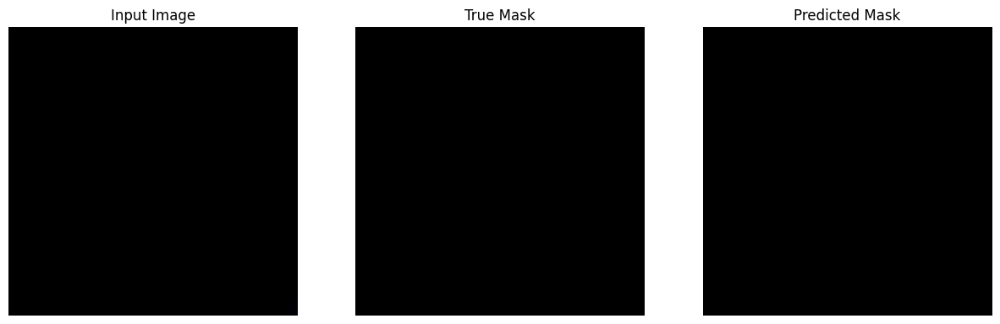

1/1 [==============================] - 0s 41ms/step


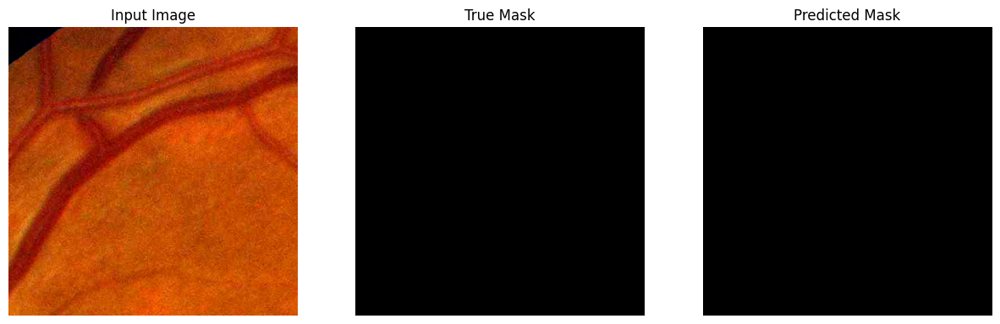

1/1 [==============================] - 0s 31ms/step


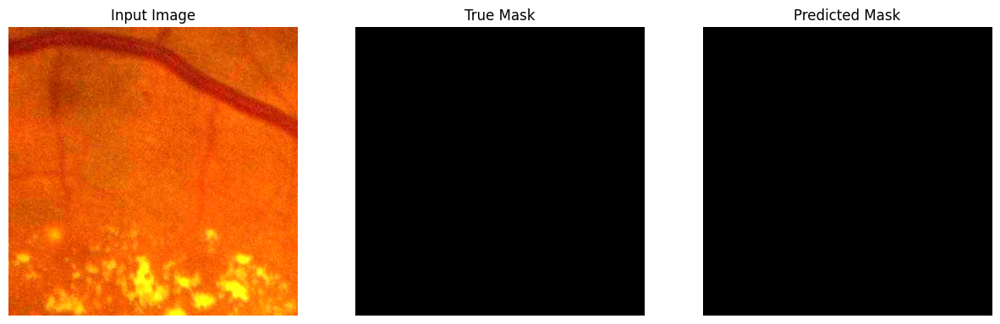

1/1 [==============================] - 0s 31ms/step


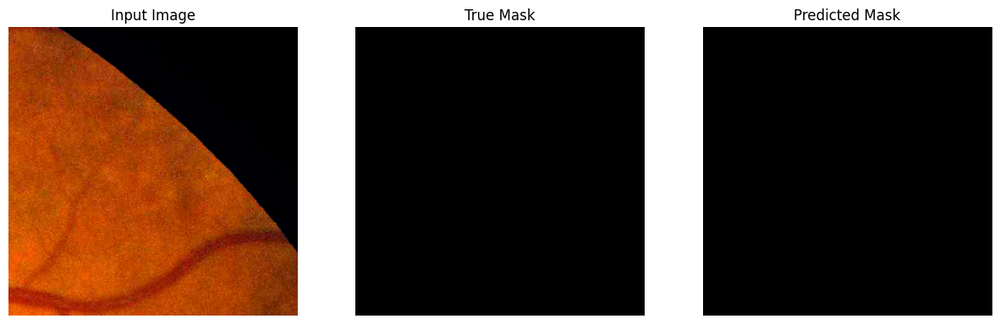

1/1 [==============================] - 0s 44ms/step


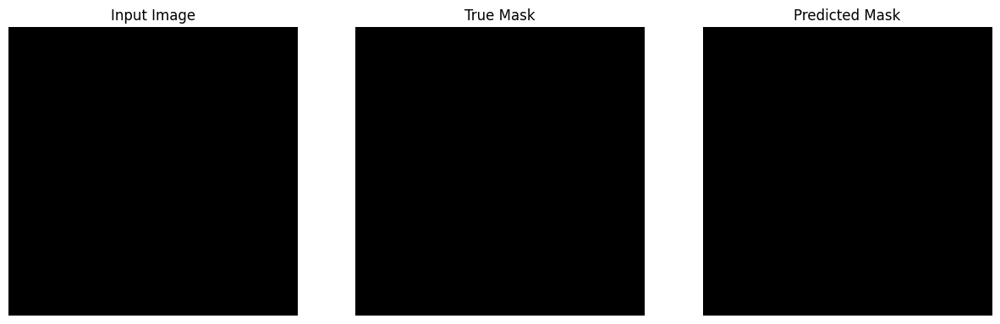

1/1 [==============================] - 0s 32ms/step


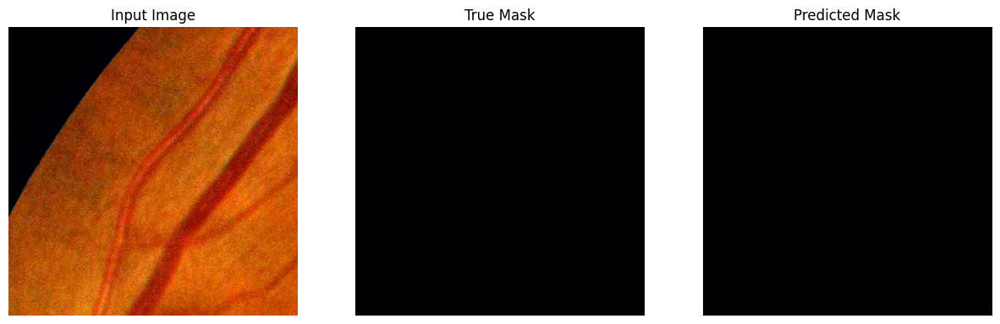

1/1 [==============================] - 0s 30ms/step


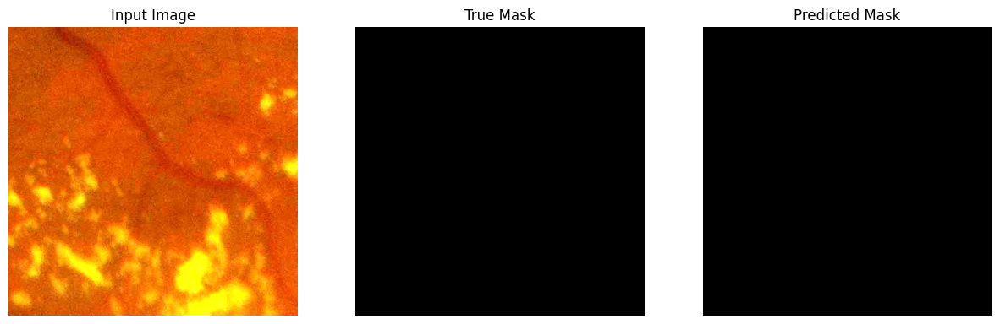

1/1 [==============================] - 0s 37ms/step


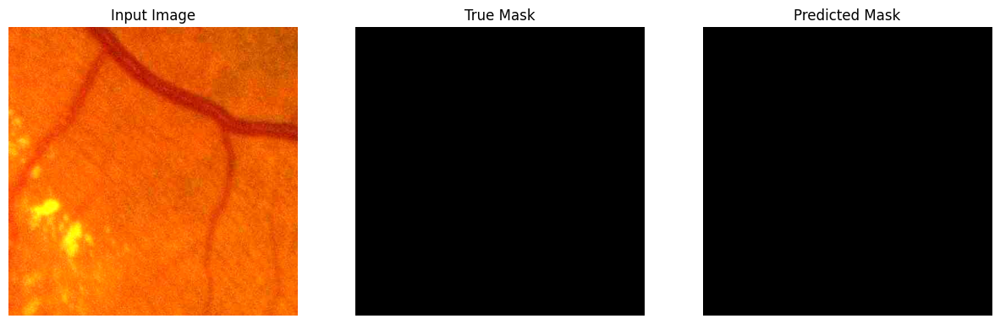

1/1 [==============================] - 0s 31ms/step


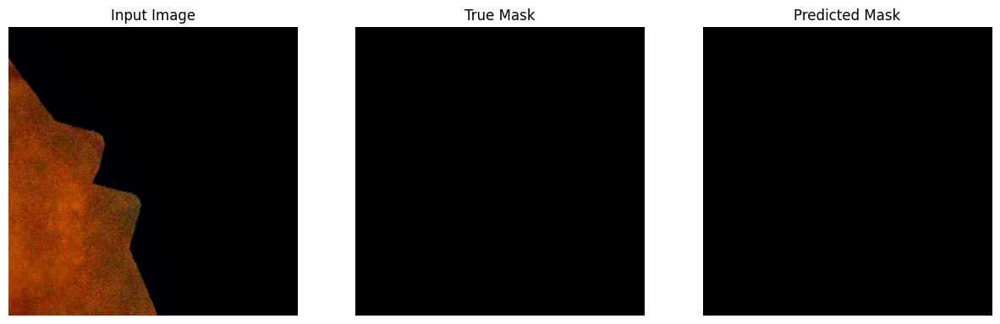

1/1 [==============================] - 0s 32ms/step


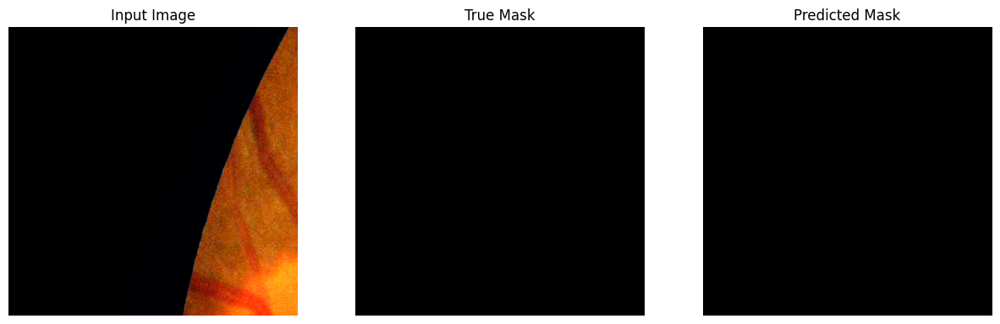

1/1 [==============================] - 0s 36ms/step


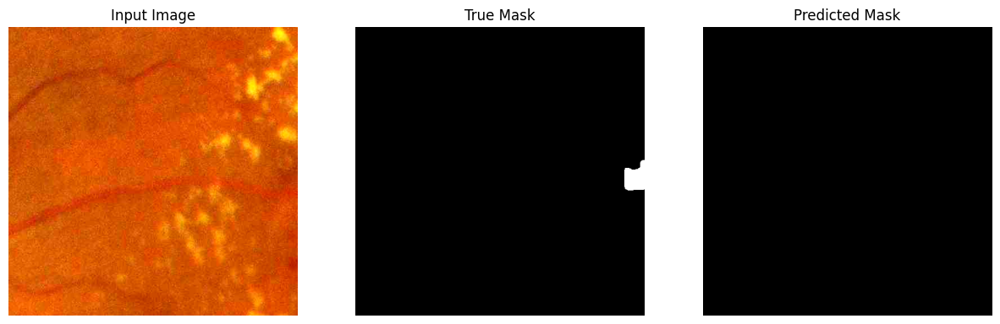

1/1 [==============================] - 0s 32ms/step


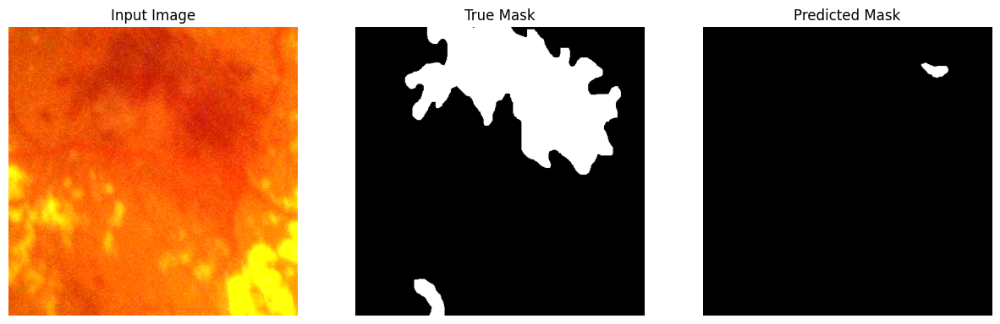

1/1 [==============================] - 0s 38ms/step


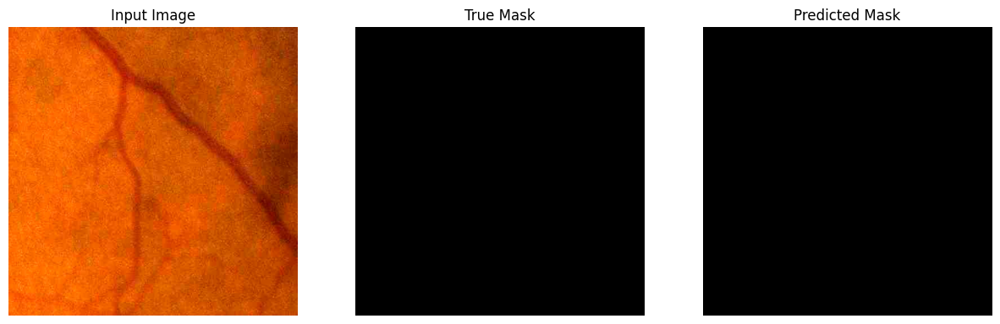

1/1 [==============================] - 0s 34ms/step


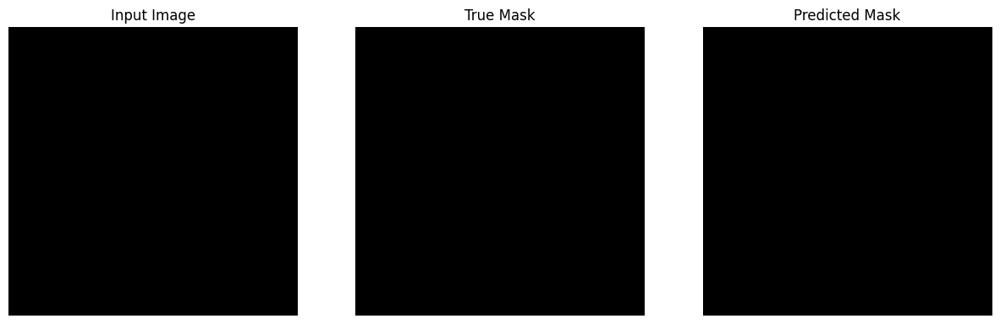

1/1 [==============================] - 0s 32ms/step


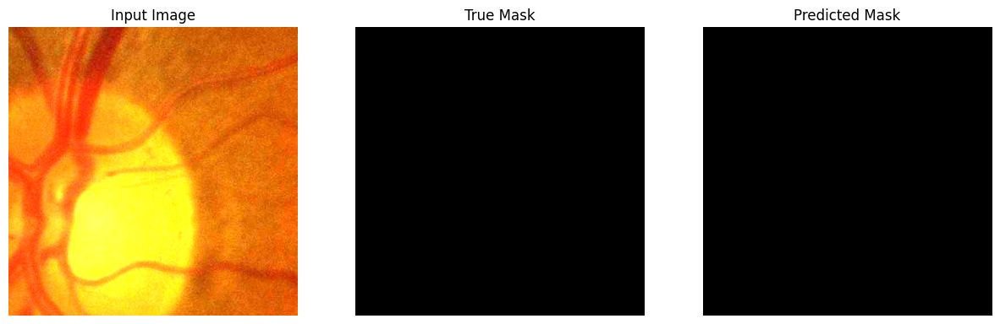

1/1 [==============================] - 0s 38ms/step


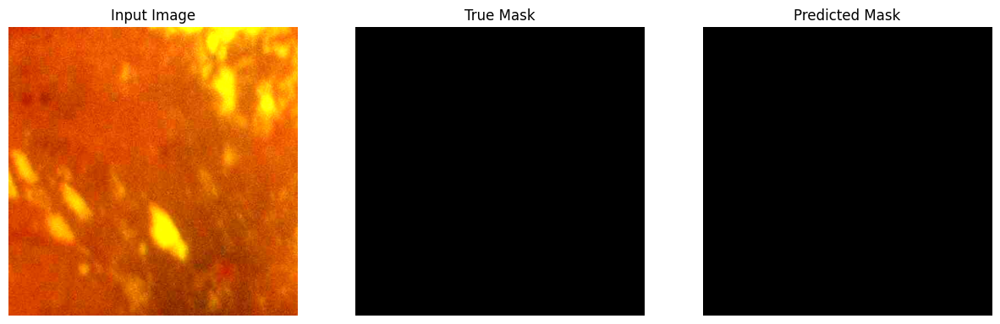

1/1 [==============================] - 0s 35ms/step


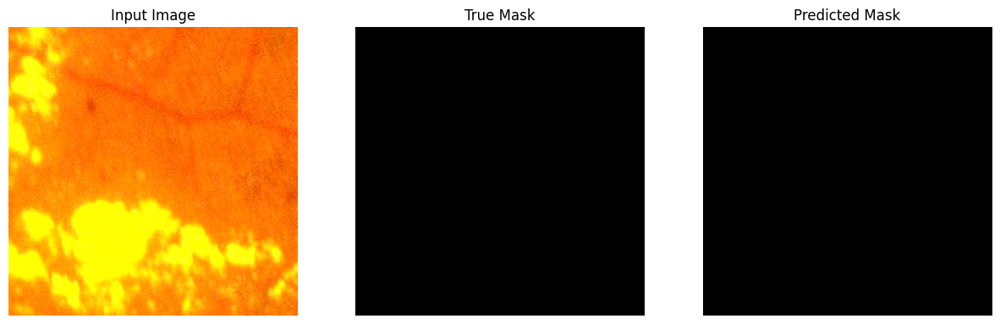

1/1 [==============================] - 0s 32ms/step


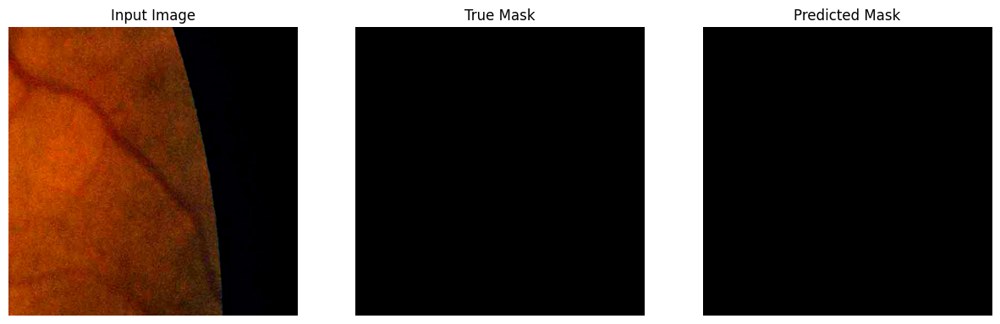

1/1 [==============================] - 0s 47ms/step


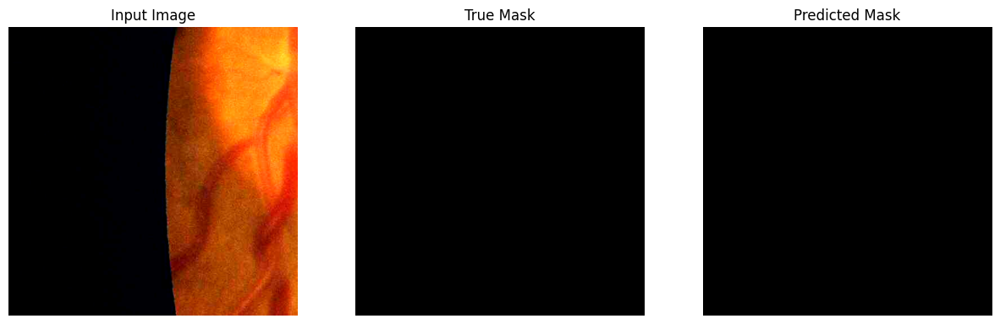

1/1 [==============================] - 0s 46ms/step


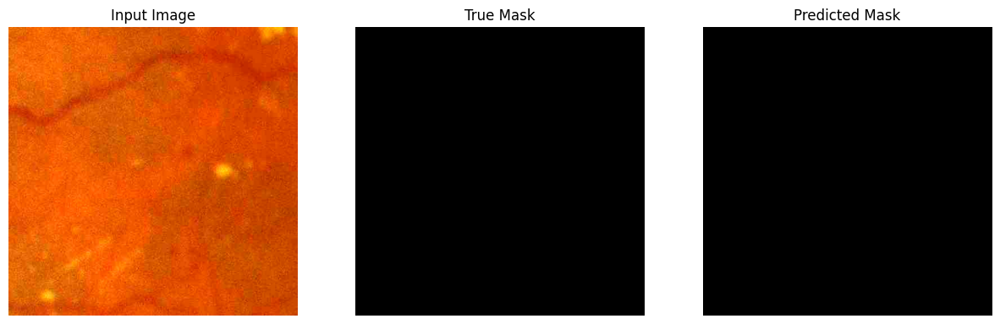

1/1 [==============================] - 0s 36ms/step


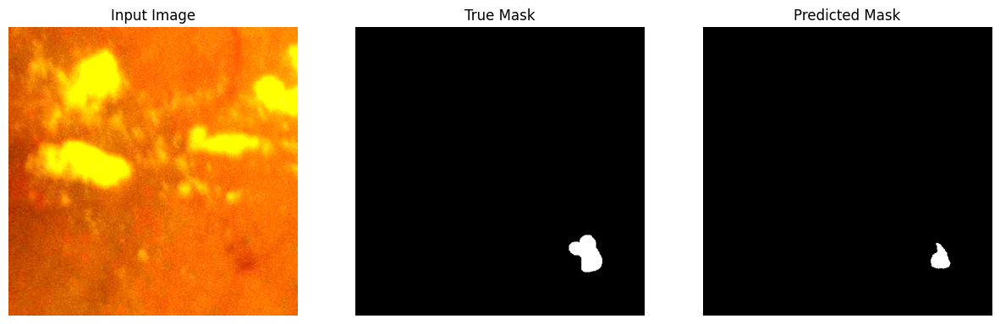

1/1 [==============================] - 0s 32ms/step


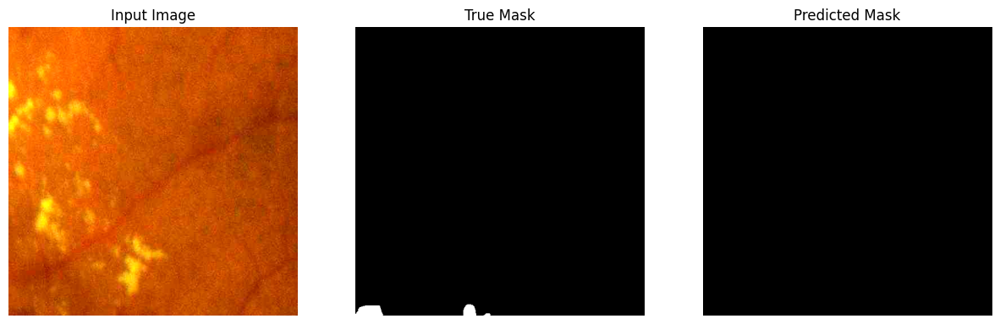

1/1 [==============================] - 0s 34ms/step


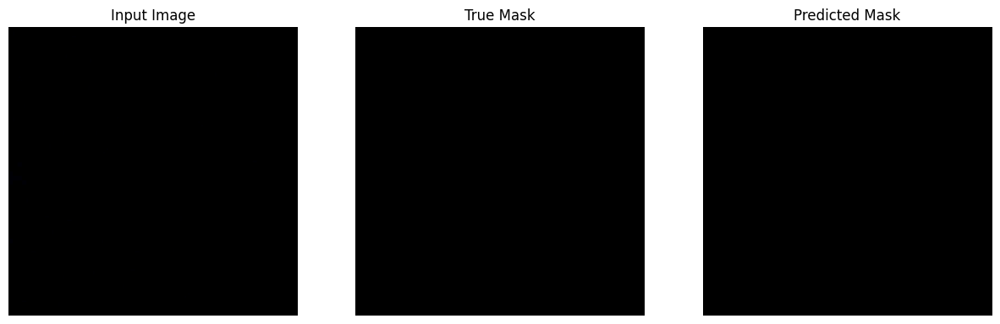

1/1 [==============================] - 0s 31ms/step


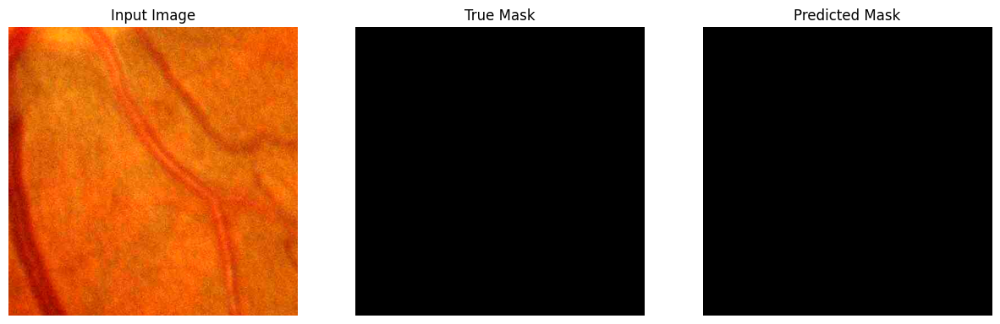

1/1 [==============================] - 0s 32ms/step


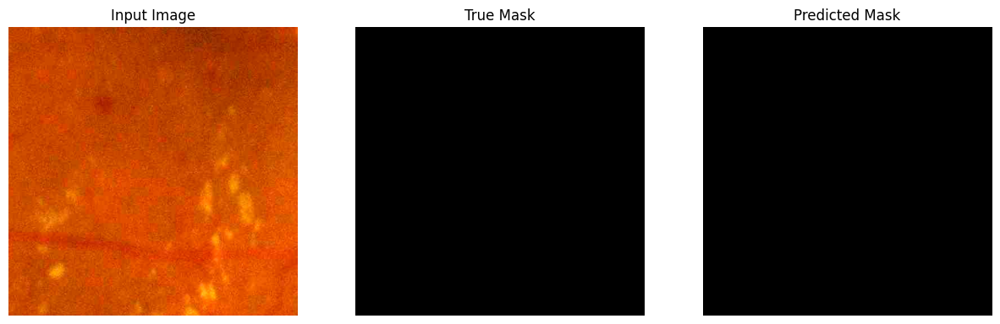

1/1 [==============================] - 0s 29ms/step


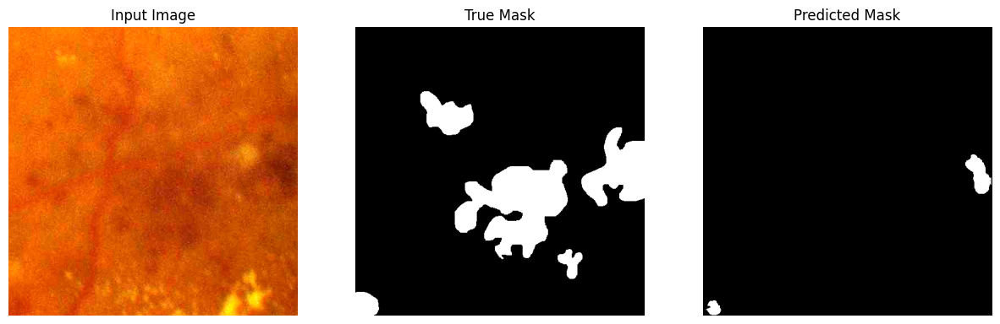

1/1 [==============================] - 0s 33ms/step


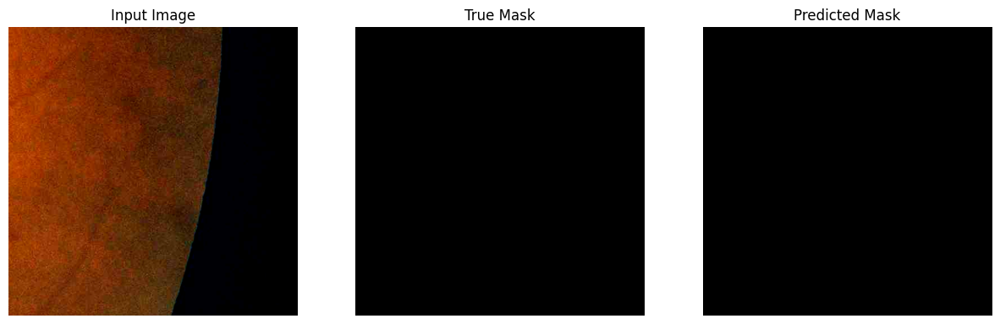

1/1 [==============================] - 0s 31ms/step


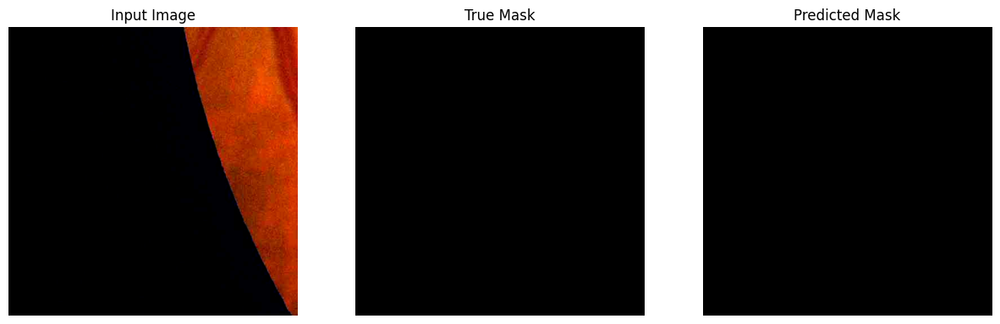

1/1 [==============================] - 0s 37ms/step


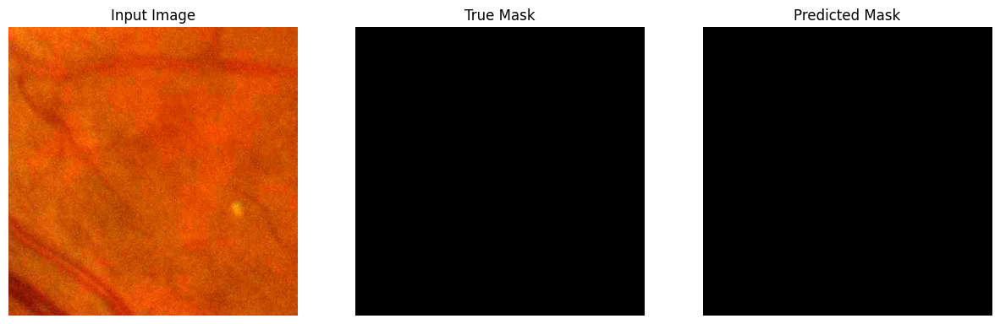

1/1 [==============================] - 0s 32ms/step


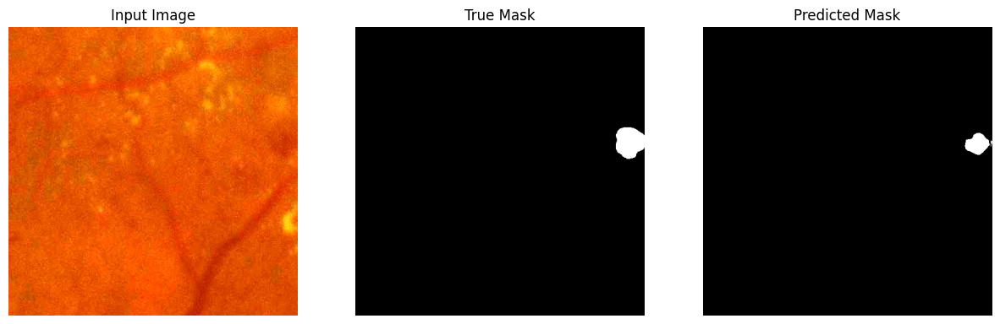

1/1 [==============================] - 0s 35ms/step


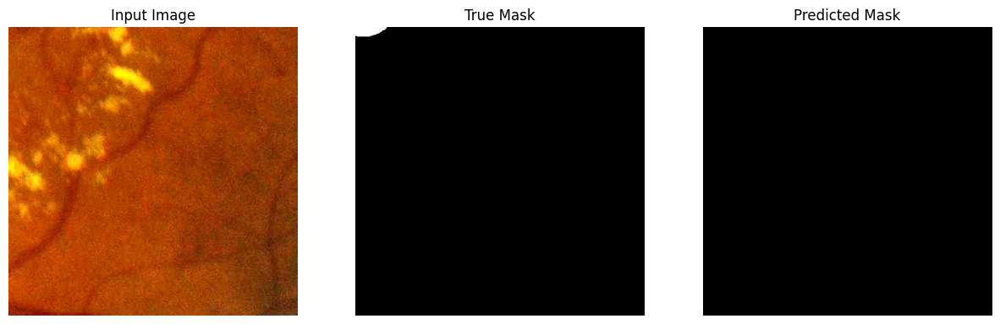

1/1 [==============================] - 0s 31ms/step


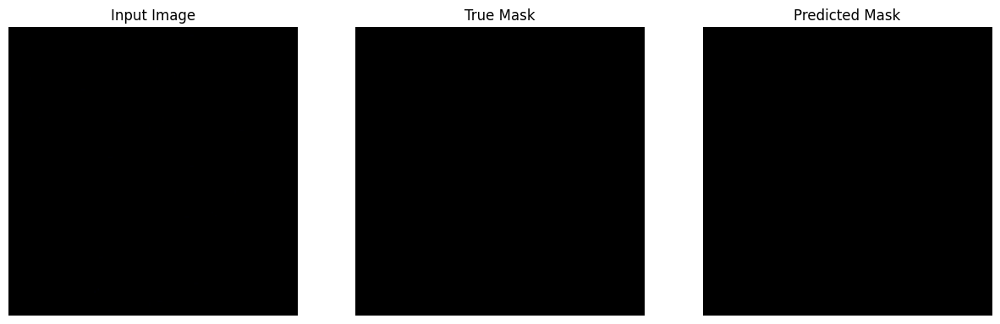

1/1 [==============================] - 0s 47ms/step


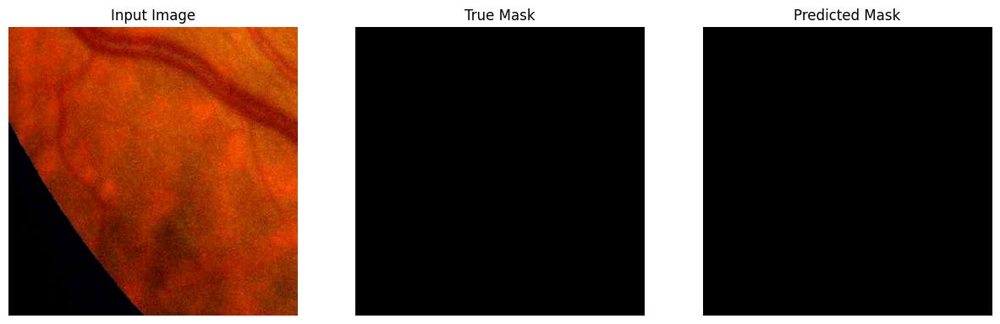

1/1 [==============================] - 0s 44ms/step


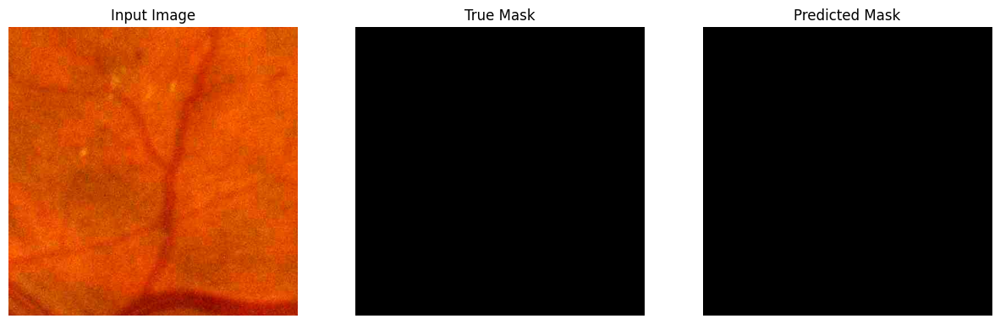

1/1 [==============================] - 0s 32ms/step


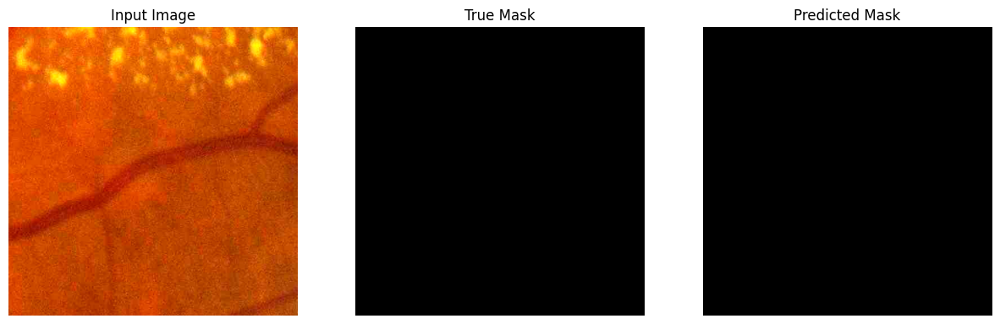

1/1 [==============================] - 0s 76ms/step


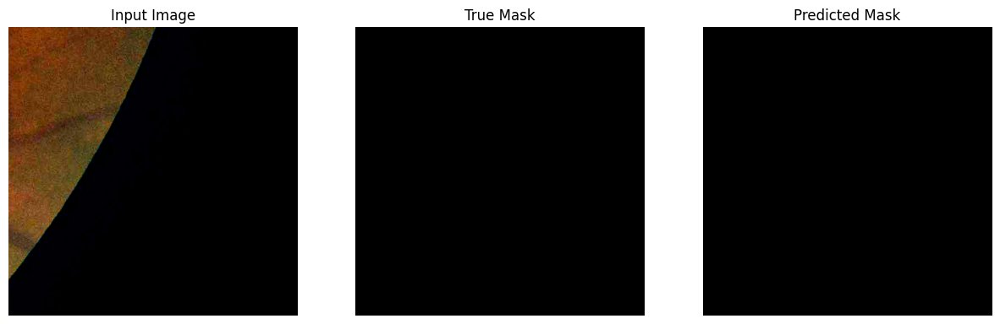

1/1 [==============================] - 0s 33ms/step


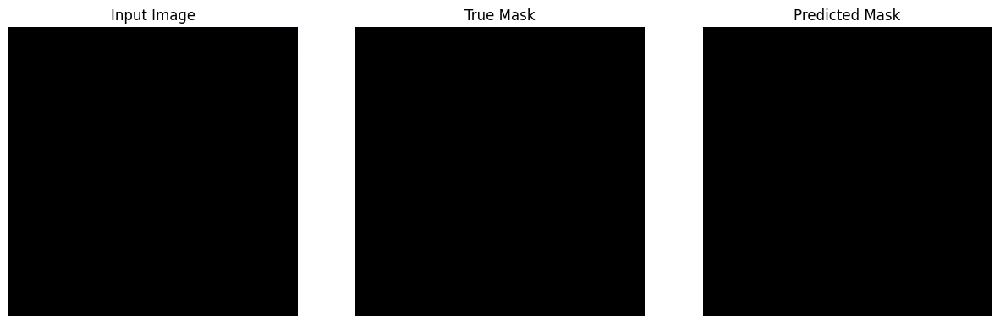

1/1 [==============================] - 0s 33ms/step


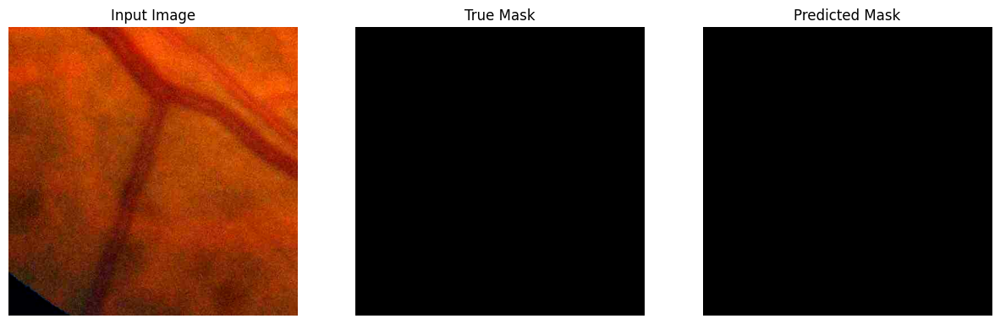

1/1 [==============================] - 0s 33ms/step


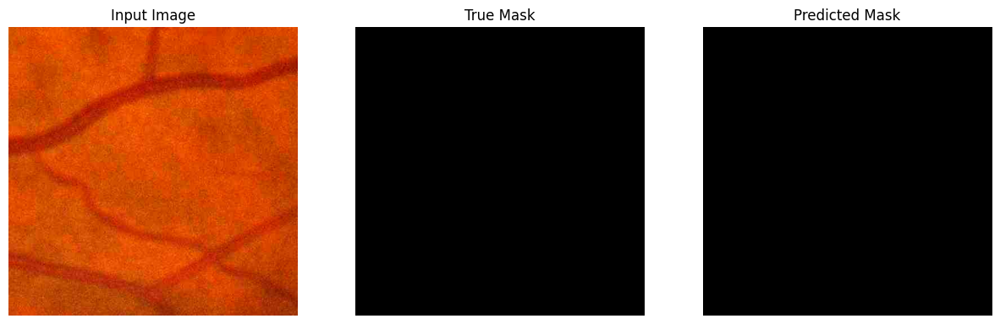

1/1 [==============================] - 0s 32ms/step


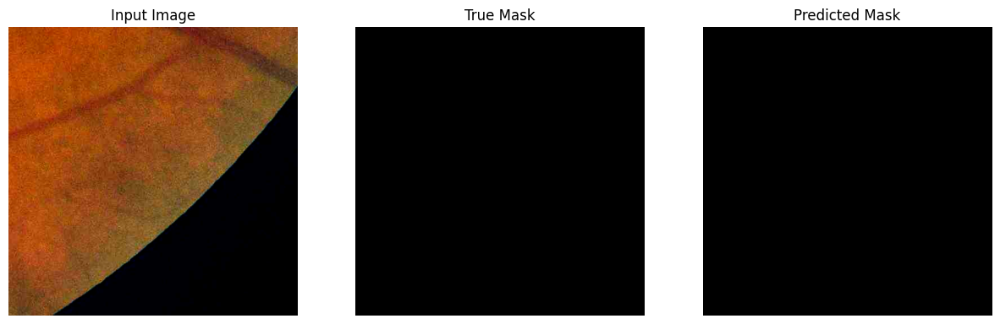

1/1 [==============================] - 0s 49ms/step


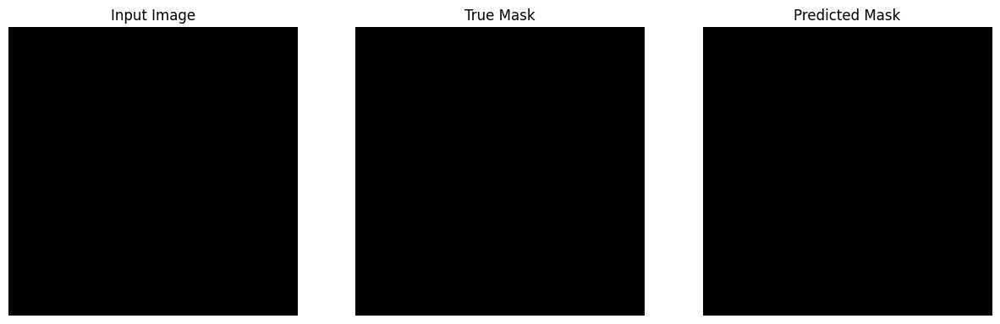

1/1 [==============================] - 0s 41ms/step


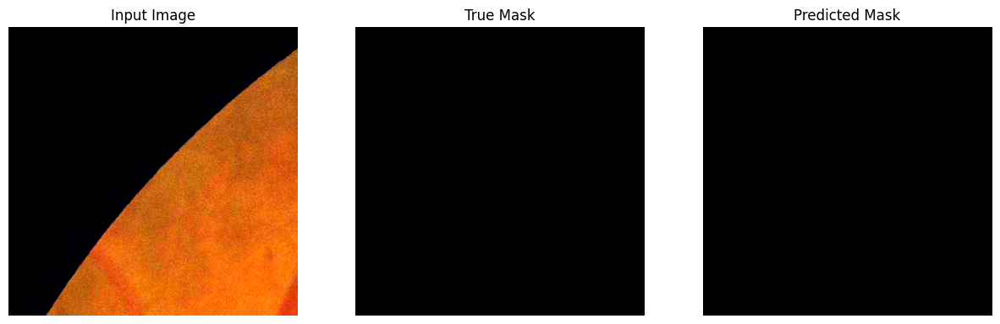

1/1 [==============================] - 0s 32ms/step


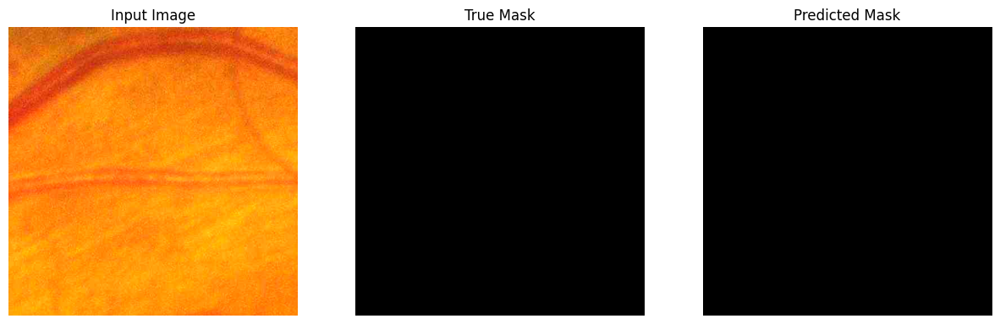

1/1 [==============================] - 0s 34ms/step


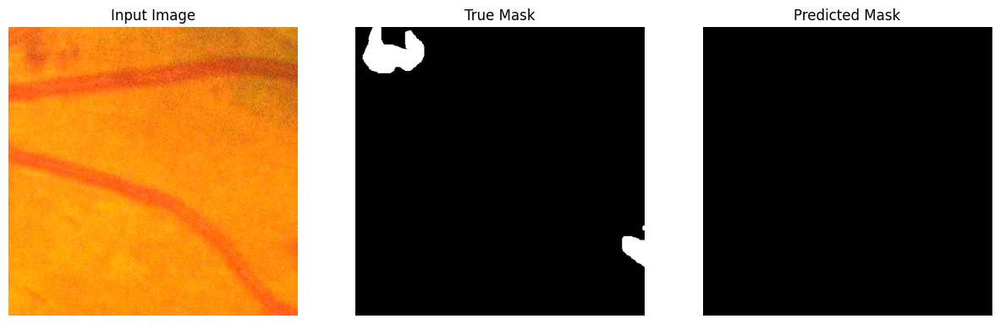

1/1 [==============================] - 0s 30ms/step


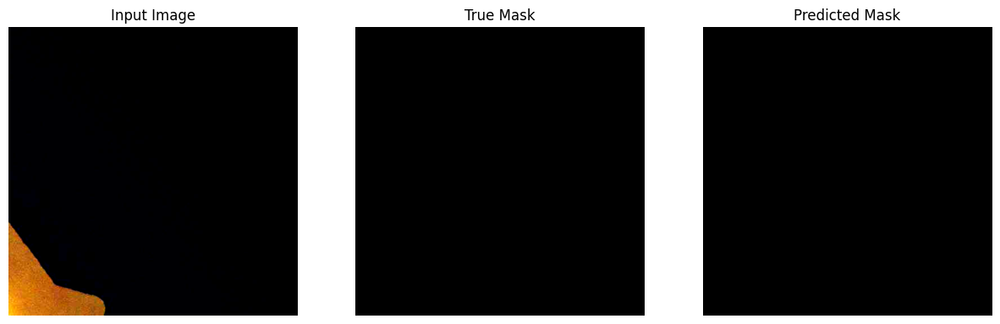

1/1 [==============================] - 0s 37ms/step


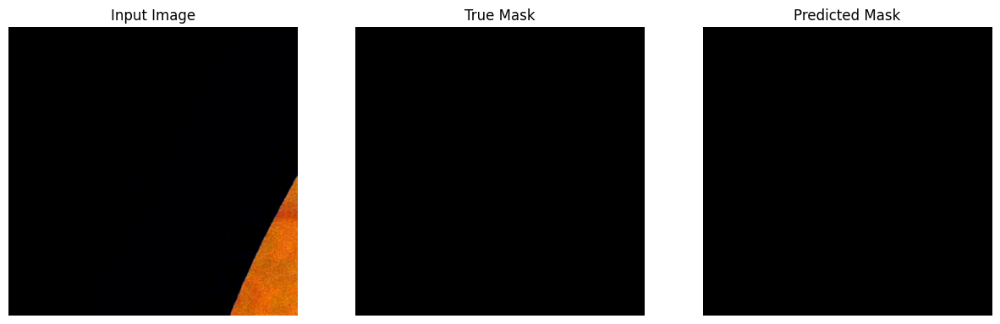

1/1 [==============================] - 0s 32ms/step


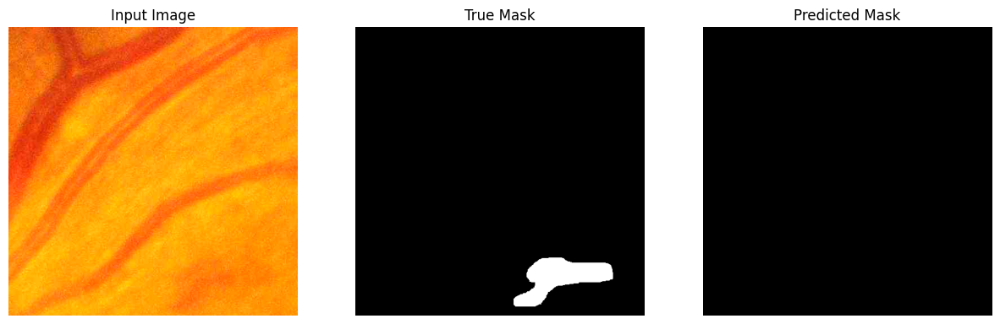

1/1 [==============================] - 0s 31ms/step


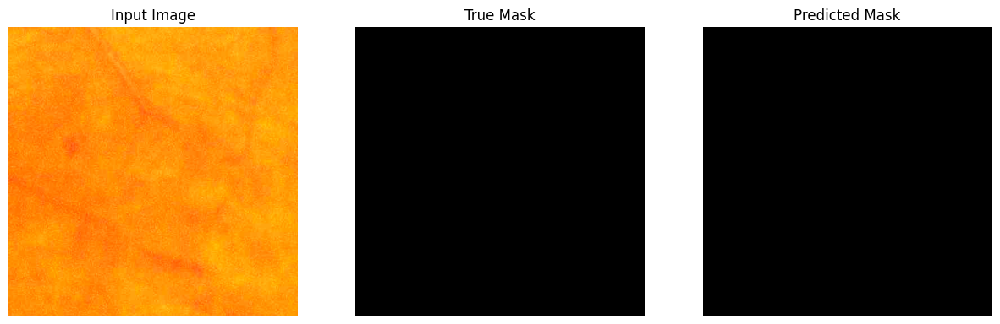

1/1 [==============================] - 0s 32ms/step


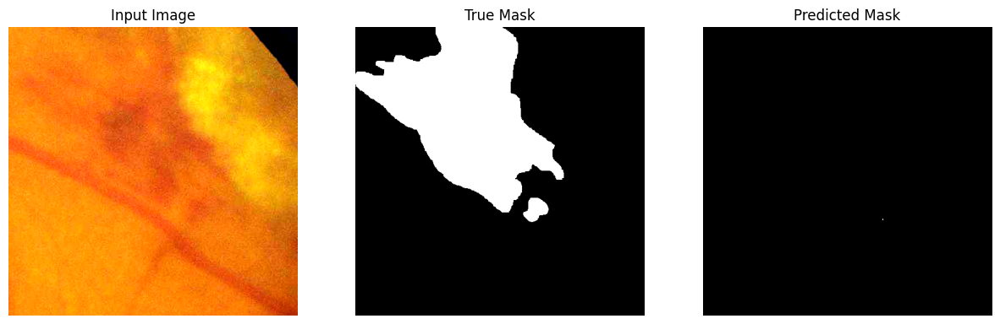

1/1 [==============================] - 0s 32ms/step


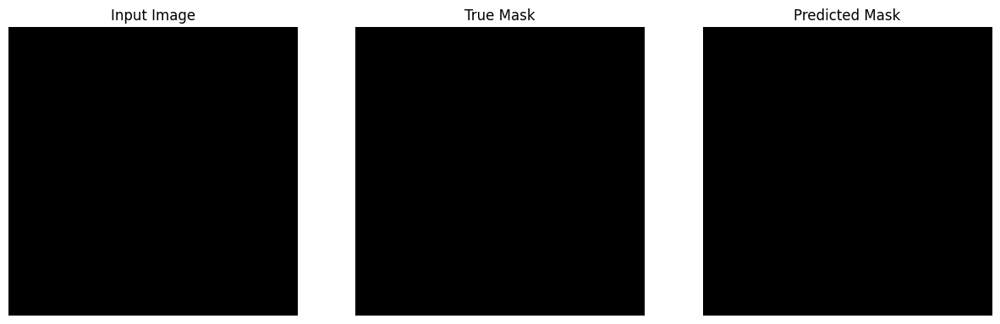

In [31]:
# Test dataset take 10
# Train dataset take 

def displayPrediction(display_list, extra_title=''):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']

    if len(display_list) > len(title):
        title.append(extra_title)

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(display_list[i], cmap='gray')
        plt.axis('off')
    plt.show()
    
def create_mask(pred_mask):
    pred_mask = (pred_mask > 0.5).astype("int32")
    return pred_mask[0]
    
for image, mask in testDataset.take(50):
    pred_mask = linknet_model.predict(image)
    displayPrediction([image[0], mask[0], create_mask(pred_mask)])
